In [57]:
from Summary_Project import analysis, results
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics.pairwise import pairwise_distances
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.cluster.hierarchy import fcluster
import random
from sklearn.cluster import AgglomerativeClustering
from sklearn import metrics

In [58]:
IBD_1000 = results["IBD_1000"]
IBD_1000_T = results["IBD_1000_T"]

Eran_Elinav = results['Eran_Elinav']
Eran_Elinav_T = results['Eran_Elinav_T']

#Gevers = results['Gevers']
#Gevers_T = results['Gevers_T']

HMP1 = results['HMP1']
HMP1_T = results['HMP1_T']

HMP2 = results['HMP2']
HMP2_T = results['HMP2_T']

HMP2_pilot = results['HMP2_pilot']
HMP2_pilot_T = results['HMP2_pilot_T']

HMP3 = results['HMP3']
HMP3_T = results['HMP3_T']

ibdmdb = results['ibdmdb']
ibdmdb_T = results['ibdmdb_T']

ibdmdb2 = results['ibdmdb2']
ibdmdb2_T = results['ibdmdb2_T']

Lewis = results['Lewis']
Lewis_T = results['Lewis_T']

MetaHit = results['MetaHit']
MetaHit_T = results['MetaHit_T']

MetaHit2 = results['MetaHit2']
MetaHit2_T = results['MetaHit2_T']

disease_counts = results['disease_counts']
disease_counts

,IBD_1000,EranElinav,HMP1,HMP2,HMP3,IBDMDB,HMP2_pilot,IBDMDB2,Lewis,MetaHit,MetaHit2,Total_Patients
Diagnosis,,,,,,,,,,,,
CD,206,36,0,0,0,62,59,50,87,4,13,517
UC,126,24,0,0,0,35,34,30,0,21,69,339
IBD,23,0,0,0,0,0,0,0,0,0,0,23
nonIBD,0,22,140,93,89,24,24,26,26,99,189,732


In [59]:
# 35 Metaphlan control samples are missing
ID_Eran_Elinav_C = Eran_Elinav.loc[Eran_Elinav['Disease'] == 'nonIBD', 'index'].values
Eran_Elinav_C = Eran_Elinav_T.loc[Eran_Elinav_T.index.intersection(ID_Eran_Elinav_C)]

# ID_Gevers_C = Gevers.loc[Gevers["Diagnosis"] == "nonIBD", ...].values - is missing  

ID_HMP1_C = HMP1.loc[HMP1["study design"] == 'nonIBD', 'index'].values
HMP1_C = HMP1_T.loc[HMP1_T.index.intersection(ID_HMP1_C)]

ID_HMP2_C = HMP2.loc[HMP1["study design"] == 'nonIBD', 'index'].values
HMP2_C = HMP2_T.loc[HMP2_T.index.intersection(ID_HMP2_C)]


ID_HMP2_pilot_C = HMP2_pilot.loc[HMP2_pilot["diagnosis"] == 'nonIBD', 'index'].values
HMP2_pilot_C = HMP2_pilot_T.loc[HMP2_pilot_T.index.intersection(ID_HMP2_pilot_C)]

ID_HMP3_C = HMP3.loc[HMP3["isolation_source"] == 'GUT', 'index'].values
HMP3_C = HMP3_T.loc[HMP3_T.index.intersection(ID_HMP3_C)]

# 2 Metaphlan control samples are missing
ID_ibdmdb_C = ibdmdb.loc[ibdmdb["diagnosis"] == 'nonIBD', 'index'].values
ibdmdb_C = ibdmdb_T.loc[ibdmdb_T.index.intersection(ID_ibdmdb_C)]

# 1 Metaphlan control samples are missing
ID_ibdmdb2_C = ibdmdb2.loc[ibdmdb2["diagnosis"] == 'nonIBD', 'index'].values
ibdmdb2_C = ibdmdb2_T.loc[ibdmdb2_T.index.intersection(ID_ibdmdb2_C)]

ID_Lewis_C = Lewis.loc[Lewis["diagnosis"] == 'nonIBD', 'index'].values
Lewis_C = Lewis_T.loc[Lewis_T.index.intersection(ID_Lewis_C)]

ID_MetaHit_C = MetaHit.loc[MetaHit["diagnosis"] == 'nonIBD', 'index'].values
MetaHit_C = MetaHit_T.loc[MetaHit_T.index.intersection(ID_MetaHit_C)]

ID_MetaHit2_C = MetaHit2.loc[MetaHit2["Health Status"] == "nonIBD", 'index'].values 
MetaHit2_C = MetaHit2_T.loc[MetaHit2_T.index.intersection(ID_MetaHit2_C)]

only over 90 patients per project

In [60]:
df_list = [ ("HMP1", HMP1_C), ("HMP2",HMP2_C),("HMP3" , HMP3_C),("MetaHit", MetaHit_C), ("MetaHit2", MetaHit2_C)]

Replace NaN Values with Zero


In [67]:
Threshold = 0.01
for project_name, df in df_list:
    # Filter the DataFrame
    df_filtered = df[df >= Threshold].dropna(how='all')  # This removes all rows where all elements are NaN
    # Fill NaN values with 0
    df_filtered = df_filtered.fillna(0)
    # Binarize the values
    df_filtered[df_filtered >= Threshold] = 1 #set relative 
    df_filtered[df_filtered < Threshold] = 0
    print(f'{project_name}: {df_filtered.shape}')

HMP1: (140, 3280)
HMP2: (94, 3219)
HMP3: (87, 2580)
MetaHit: (99, 4610)
MetaHit2: (189, 5328)


In [68]:
Threshold = 0.01
filtered_dfs = {} 
for project_name, df in df_list:
    # Filter the DataFrame
    df_filtered = df[df >= Threshold].dropna(how='all')  # This removes all rows where all elements are NaN
    # Fill NaN values with 0
    df_filtered = df_filtered.fillna(0)
    # Binarize the values
    df_filtered[df_filtered >= Threshold] = 1
    df_filtered[df_filtered < Threshold] = 0
    
    # Filter columns based on their sum
    df_filtered = df_filtered.loc[:, (df_filtered.sum() > df_filtered.shape[0] * 0.1) &
                                      (df_filtered.sum() < df_filtered.shape[0] * 0.9)]
    
    df_filtered = df_filtered.loc[:, df_filtered.columns.str.startswith("s__")]
    filtered_dfs[project_name] = df_filtered 

    print(f'{project_name}: {df_filtered.shape}')


HMP1: (140, 269)
HMP2: (94, 272)
HMP3: (87, 257)
MetaHit: (99, 556)
MetaHit2: (189, 515)


In [69]:
HMP1 = filtered_dfs["HMP1"].fillna(0)
HMP2 = filtered_dfs["HMP2"]
HMP3 = filtered_dfs["HMP3"]
MetaHit = filtered_dfs["MetaHit"]
MetaHit2 = filtered_dfs["MetaHit2"]

In [70]:
random.seed(8)
permuted_dfs = {}

for project_name, df_filtered in filtered_dfs.items():
    # Apply a random permutation to each column
    df_permuted = df_filtered.apply(lambda x: np.random.permutation(x))
    permuted_dfs[f'{project_name}_R'] = df_permuted  # Save the permuted DataFrame with the new name

In [71]:
HMP1_R = permuted_dfs["HMP1_R"].fillna(0)
HMP2_R = permuted_dfs["HMP2_R"]
HMP3_R = permuted_dfs["HMP3_R"]
MetaHit_R = permuted_dfs["MetaHit_R"]
MetaHit2_R = permuted_dfs["MetaHit2_R"]

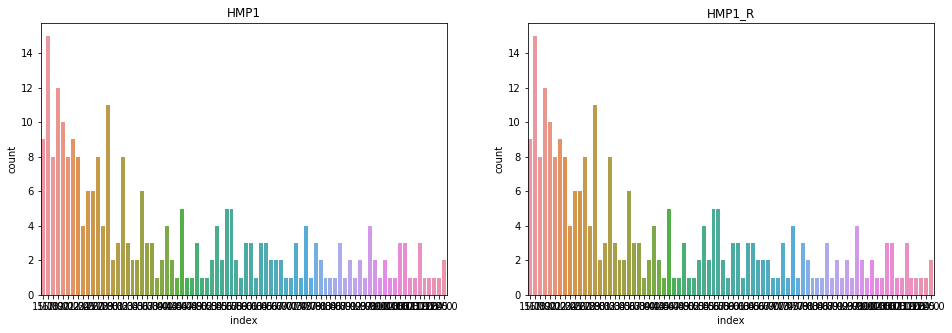

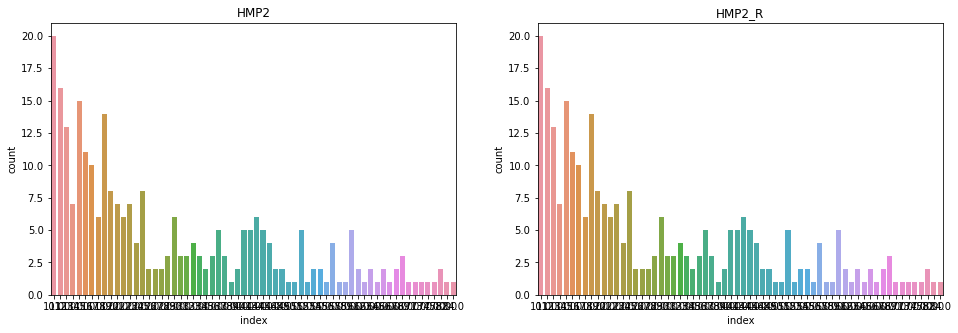

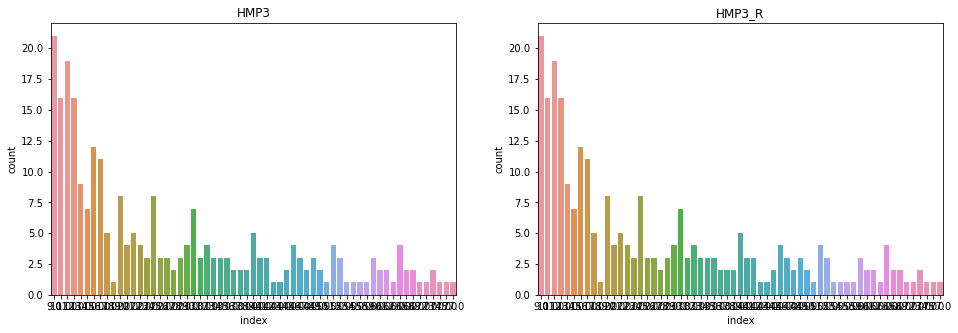

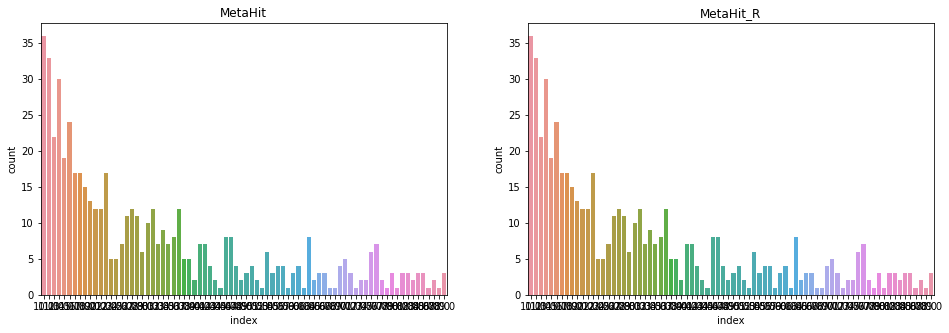

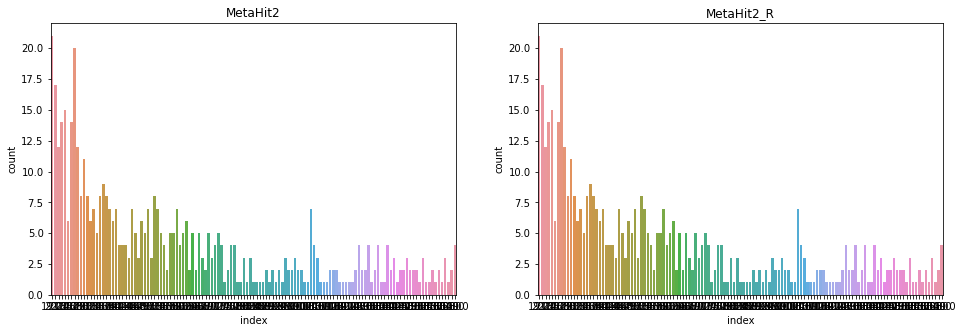

In [46]:
list_RR = {'HMP1': HMP1_R, 'HMP2': HMP2_R, 'HMP3': HMP3_R, 'MetaHit': MetaHit_R, 'MetaHit2': MetaHit2_R}

for project_name, df_R in list_RR.items():
    df = globals()[project_name]  # This is a safer alternative to eval()
    
    # Calculate the frequency of sum values for the original DataFrame
    df_freq = pd.DataFrame(df.sum().value_counts()).reset_index()
    
    # Calculate the frequency of sum values for the randomized DataFrame
    df_R_freq = pd.DataFrame(df_R.sum().value_counts()).reset_index()
    
    # Plotting the results
    plt.figure(figsize=(16, 5))

    # Plot for the original data
    plt.subplot(1, 2, 1)
    plt.title(f"{project_name}")
    sns.barplot(data=df_freq, x='index', y="count")

    # Plot for the randomized data
    plt.subplot(1, 2, 2)
    plt.title(f"{project_name}_R")
    sns.barplot(data=df_R_freq, x='index', y="count")

    plt.show()


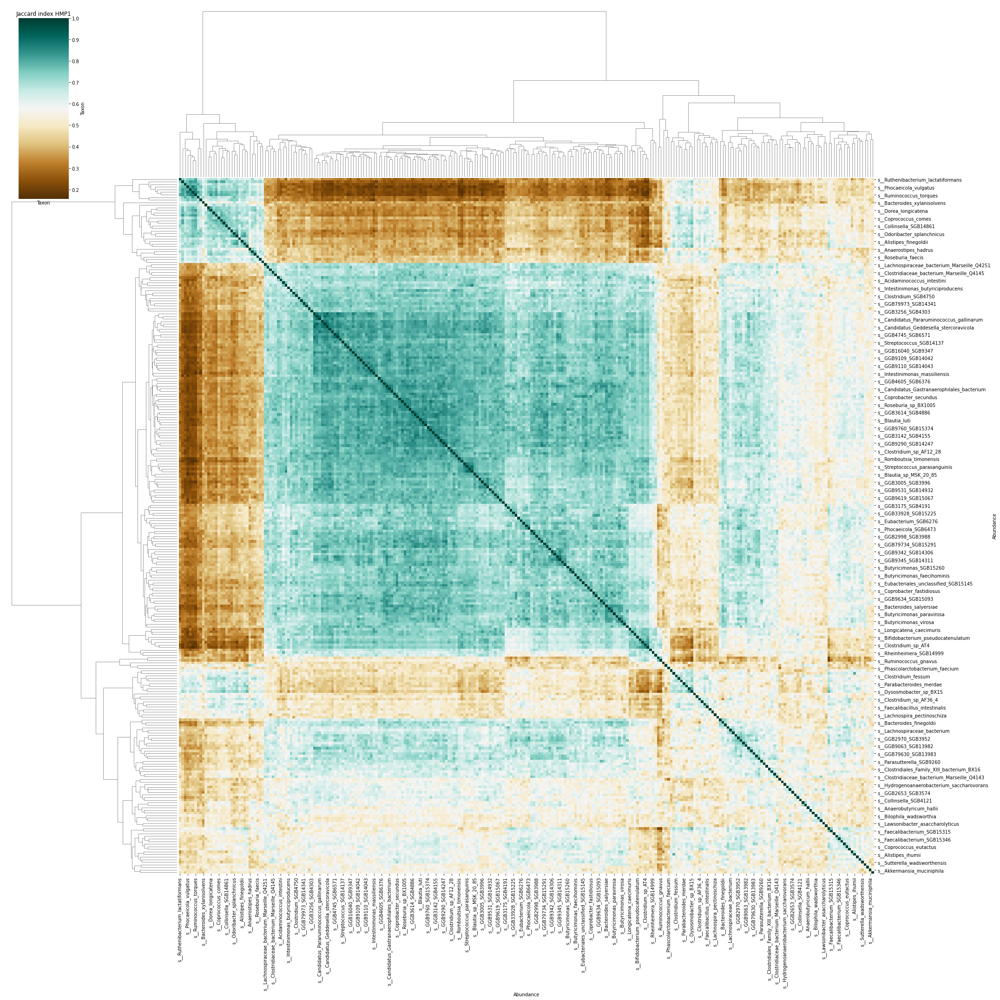

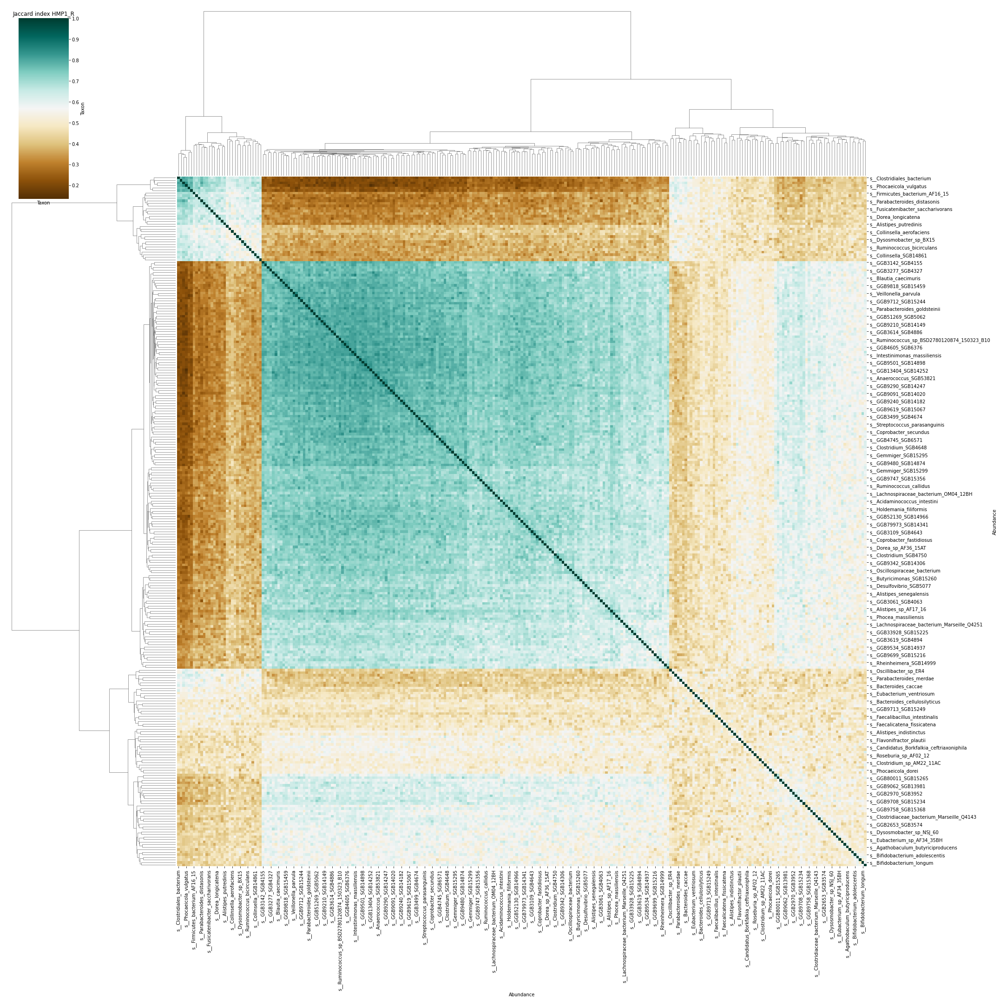

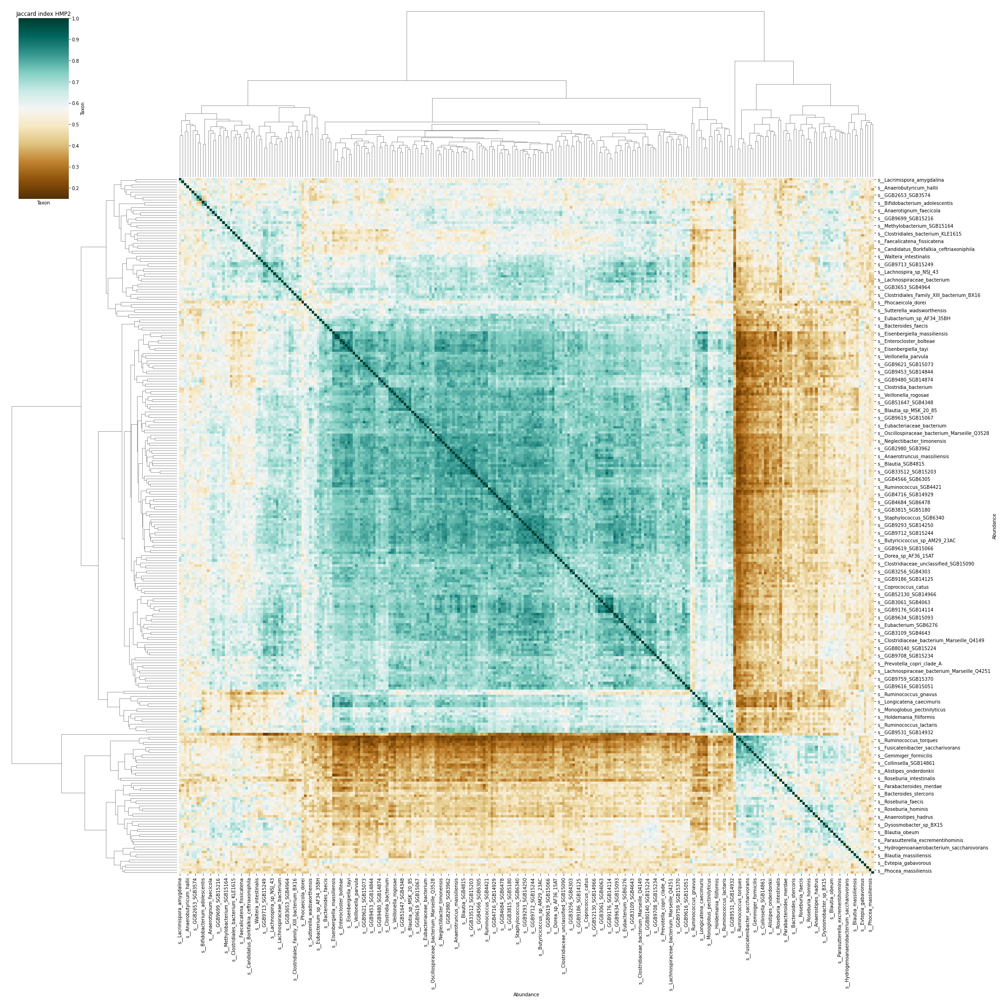

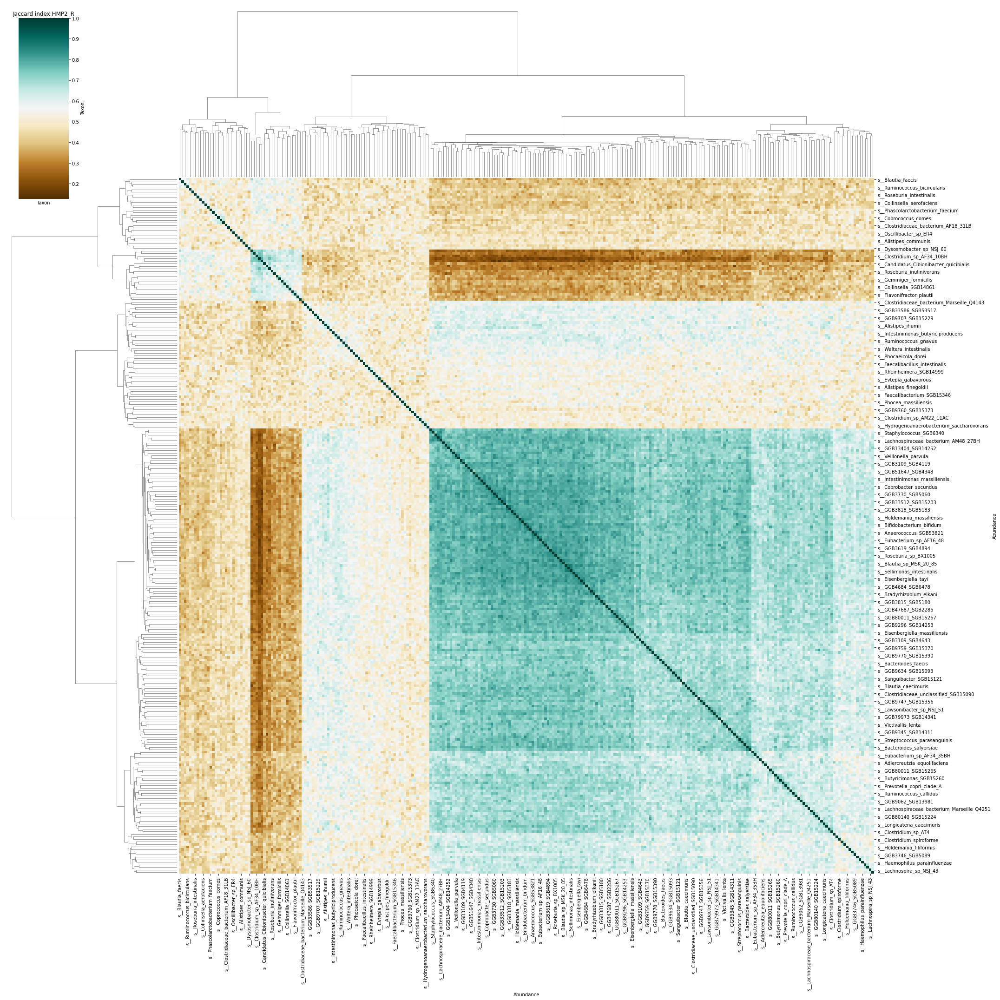

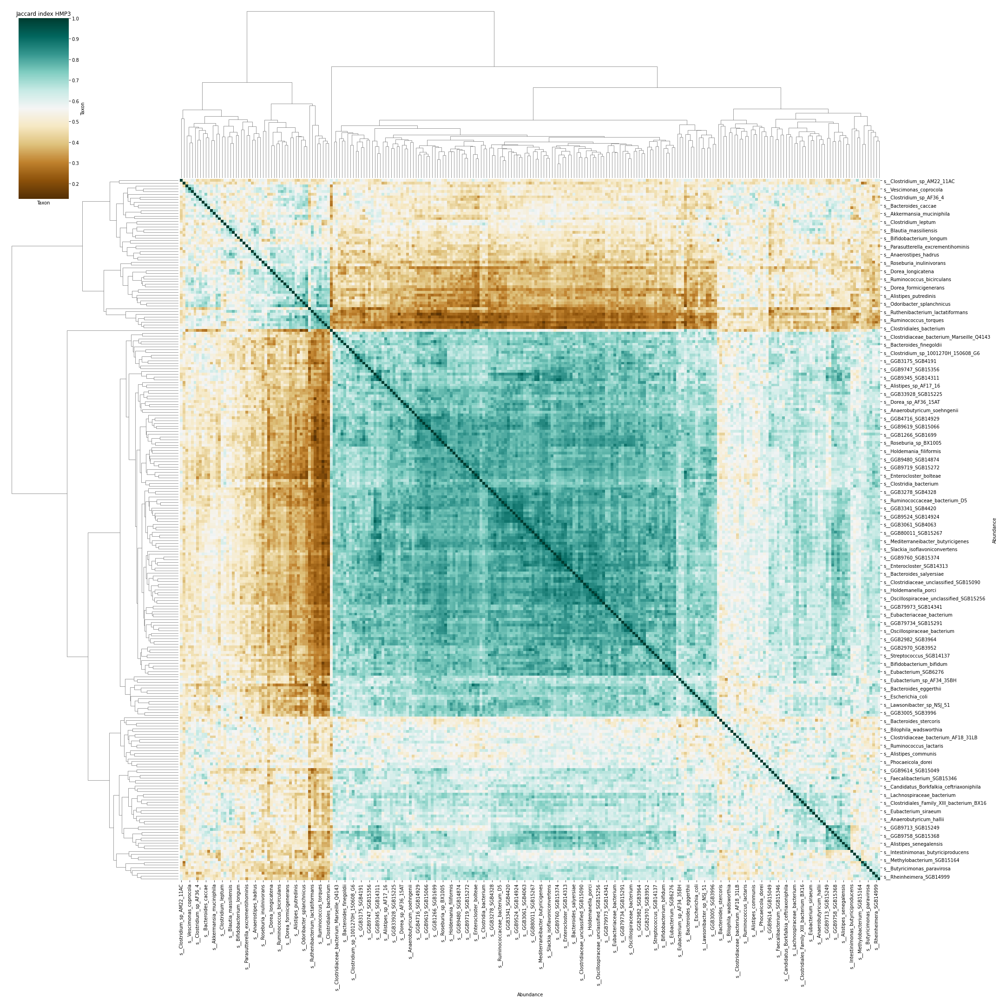

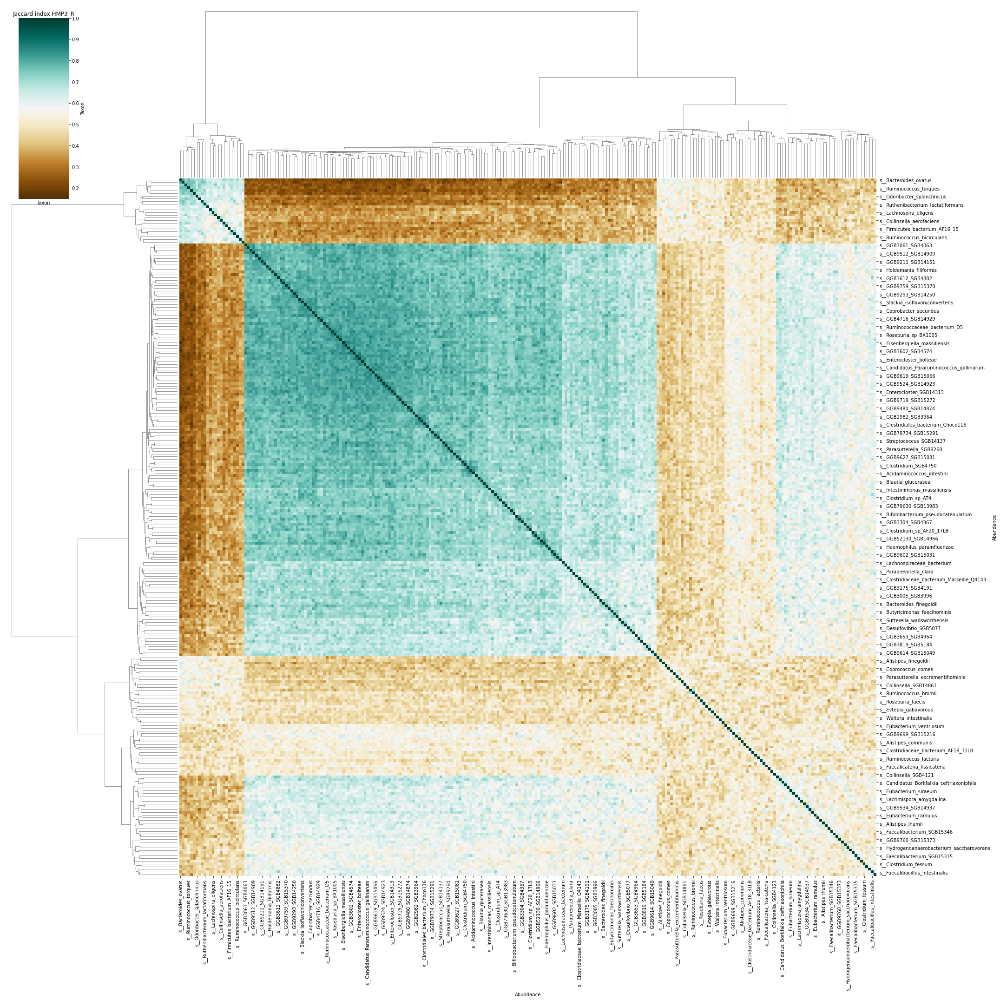

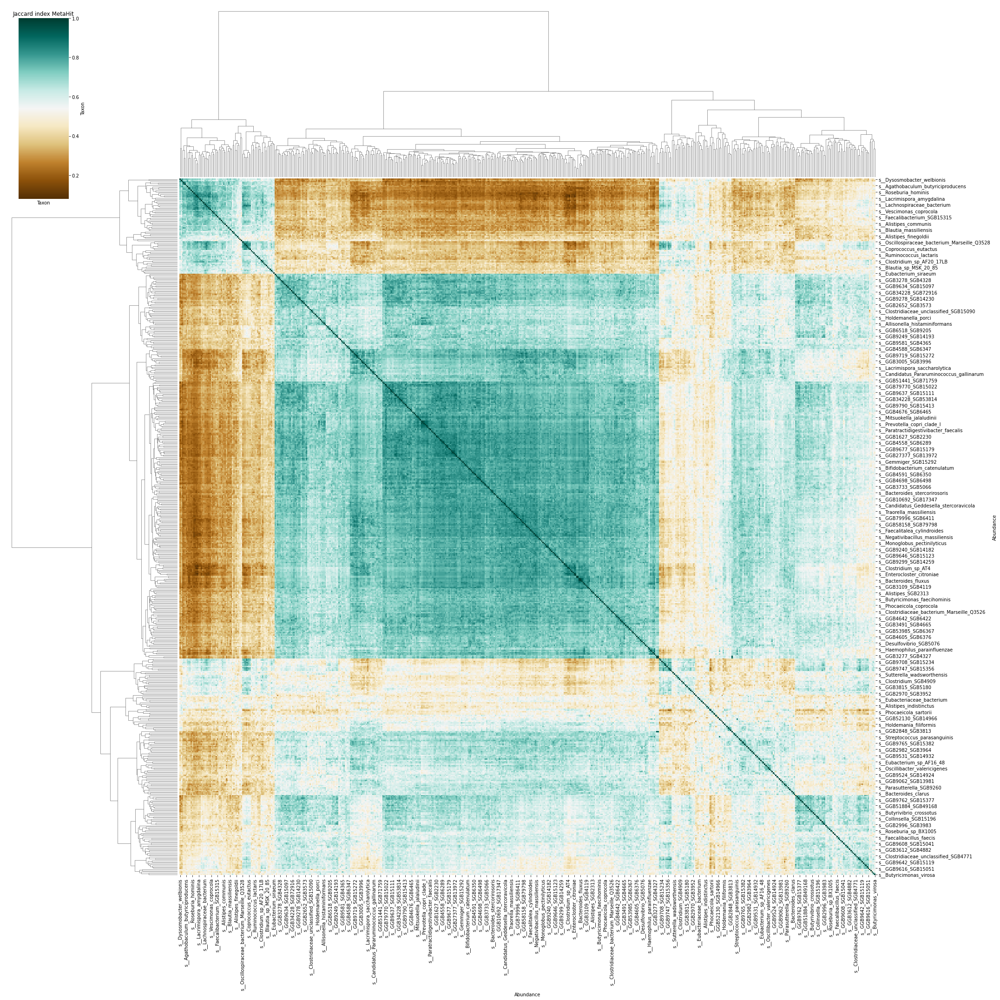

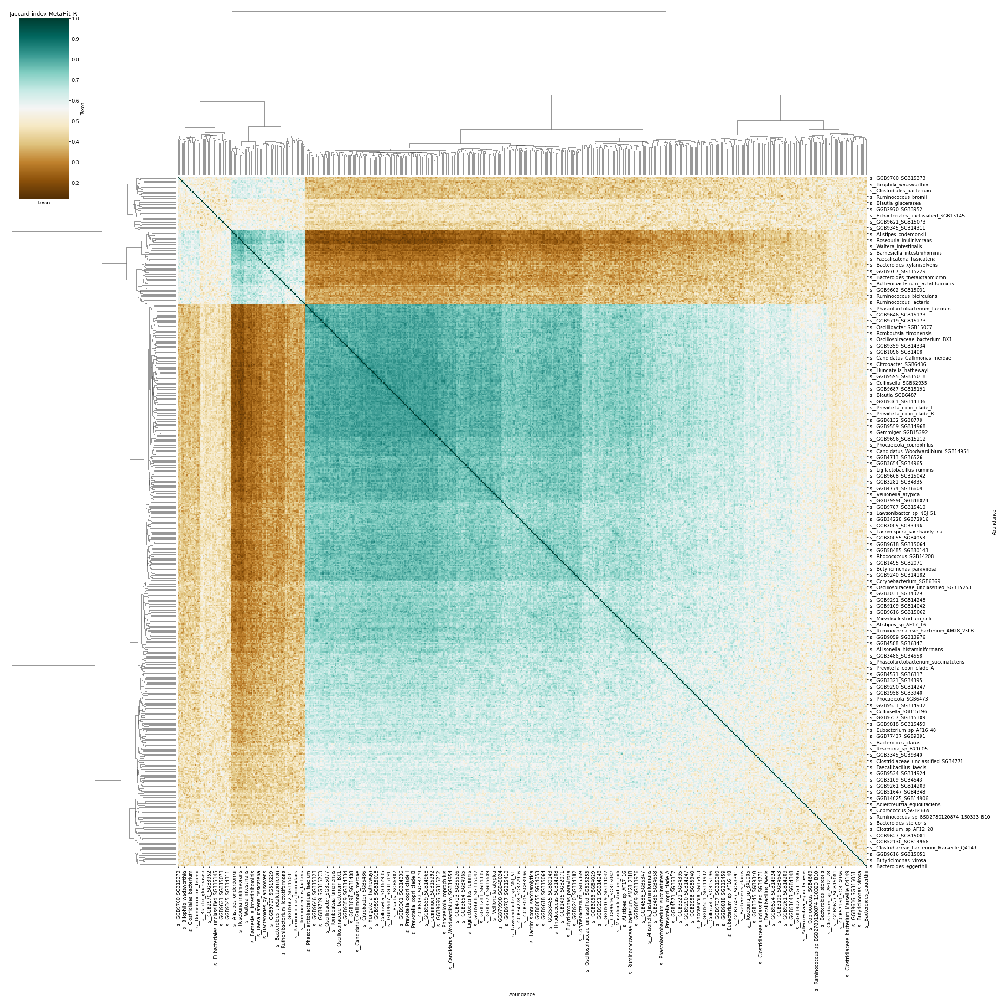

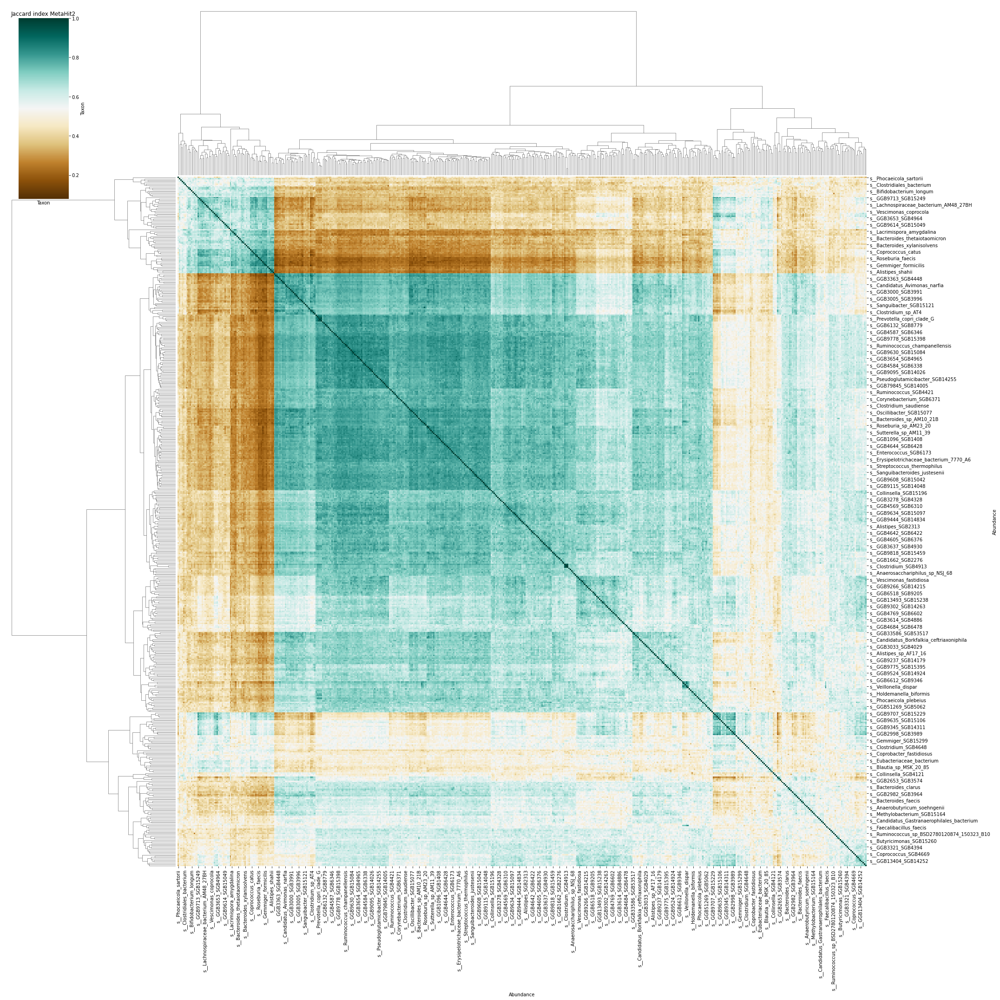

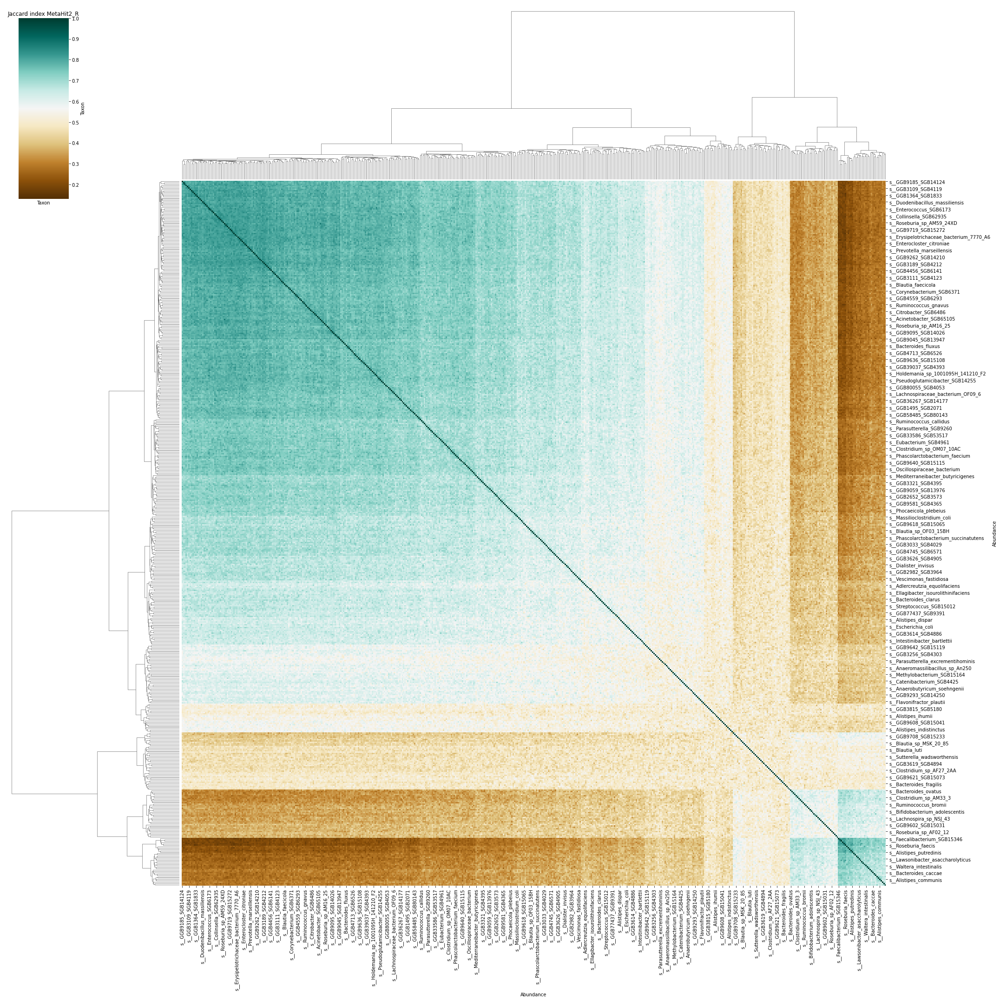

In [72]:
for project in list_RR.keys():
    # Replace M_CD with the actual DataFrame from the list_RR
    M = globals()[project]  # Original DataFrame
    M_R = list_RR[project]  # Randomized DataFrame
    
    # Compute Jaccard similarity for the original DataFrame
    jac_sim = 1 - pairwise_distances(M.T, metric="hamming")
    jac_sim = pd.DataFrame(jac_sim, index=M.columns, columns=M.columns)

    # Compute Jaccard similarity for the randomized DataFrame
    jac_sim_R = 1 - pairwise_distances(M_R.T, metric="hamming")
    jac_sim_R = pd.DataFrame(jac_sim_R, index=M_R.columns, columns=M_R.columns)
    
    # Plot the clustermap for the original DataFrame
    cluster_plot = sns.clustermap(jac_sim, cmap='BrBG', figsize=(30, 30))
    plt.title(f'Jaccard index {project}')
    plt.xlabel('Taxon')  
    plt.ylabel('Taxon') 
    plt.show()

    # Plot the clustermap for the randomized DataFrame
    cluster_plot_R = sns.clustermap(jac_sim_R, cmap='BrBG', figsize=(30, 30))
    plt.title(f'Jaccard index {project}_R')
    plt.xlabel('Taxon')  
    plt.ylabel('Taxon') 
    plt.show()